# Data Integration Project (GH1026152)

## Reading the NYC Taxi dataset for the month of May 2025.

### Data Loading

In [0]:
nycmayDF = spark.read.format("parquet").load("dbfs:/FileStore/tables/NYCTaxi/yellow_tripdata_2025_05.parquet")


display(nycmayDF)


VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
1,2025-05-01T00:07:06,2025-05-01T00:24:15,1,3.7,1,N,140,202,1,18.4,4.25,0.5,4.85,0.0,1.0,29.0,2.5,0.0,0.75
2,2025-05-01T00:07:44,2025-05-01T00:14:27,1,1.03,1,N,234,161,1,8.6,1.0,0.5,4.3,0.0,1.0,18.65,2.5,0.0,0.75
2,2025-05-01T00:15:56,2025-05-01T00:23:53,1,1.57,1,N,161,234,2,10.0,1.0,0.5,0.0,0.0,1.0,15.75,2.5,0.0,0.75
2,2025-05-01T00:00:09,2025-05-01T00:25:29,1,9.48,1,N,138,90,1,40.8,6.0,0.5,11.7,6.94,1.0,71.94,2.5,1.75,0.75
2,2025-05-01T00:45:07,2025-05-01T00:52:45,1,1.8,1,N,90,231,1,10.0,1.0,0.5,1.5,0.0,1.0,17.25,2.5,0.0,0.75
2,2025-05-01T00:09:24,2025-05-01T00:22:04,1,5.11,1,N,138,226,1,22.6,6.0,0.5,6.02,0.0,1.0,37.87,0.0,1.75,0.0
1,2025-05-01T00:18:14,2025-05-01T00:27:38,0,1.5,1,N,140,263,1,11.4,3.5,0.5,4.05,0.0,1.0,20.45,2.5,0.0,0.0
2,2025-04-30T23:50:34,2025-04-30T23:56:06,2,0.99,1,N,234,79,1,7.9,1.0,0.5,2.73,0.0,1.0,16.38,2.5,0.0,0.75
2,2025-05-01T00:04:45,2025-05-01T00:07:43,1,0.47,1,N,114,144,2,5.1,1.0,0.5,0.0,0.0,1.0,10.85,2.5,0.0,0.75
7,2025-05-01T00:22:31,2025-05-01T00:22:31,1,1.09,1,N,229,43,1,8.6,0.0,0.5,2.87,0.0,1.0,17.22,2.5,0.0,0.75


In [0]:
nycmayDF.count()


4591845

The dataset contains nearly 4.6 million rows and 20 columns.

In [0]:
nycmayDF.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: timestamp_ntz (nullable = true)
 |-- tpep_dropoff_datetime: timestamp_ntz (nullable = true)
 |-- passenger_count: long (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: long (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: long (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- Airport_fee: double (nullable = true)
 |-- cbd_congestion_fee: double (nullable = true)



In [0]:
display(nycmayDF.describe())

nycmayDF.count()

summary,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
count,4591845,3395669,4591845,3395669,3395669,4591845,4591845,4591845,4591845,4591845,4591845,4591845,4591845,4591845,4591845,3395669,3395669,4591845
mean,1.87565303271343,1.2952696508405266,7.653422240955205,2.4325848603029327,null,161.18713436538036,161.18755685350877,0.9123720421747685,18.357942774634786,1.164837976891643,0.47740782191036496,2.8581216983561757,0.5114759818739872,0.9563764891889682,26.880328194882296,2.1976766581195046,0.15319934010058106,0.5278733820501346
stddev,0.7239394919492276,0.725292694309106,653.394746643064,11.334946747051445,null,66.55046332228996,70.58758516010948,0.7590985105994551,19.8206210665261,1.845559221008445,0.13803841207607453,4.043892118912232,2.144885669844762,0.2750487173878473,24.19524285559173,0.9446371065039851,0.5431268309546236,0.3607599621736209
min,1,0,0.0,1,N,1,1,0,-998.0,-17.39,-0.5,-90.44,-148.17,-1.0,-1147.17,-2.5,-1.75,-0.75
max,7,9,263103.98,99,Y,265,265,4,1583.6,133.6,22.14,443.21,148.17,1.0,1614.29,2.5,6.75,1.25


4591845

After looking at the description of the dataset, we find that the is not clean and has many missing and negative values.

## Data Exploration and Pre-processing

In [0]:
vendorid_count=nycmayDF.groupBy('VendorID').count()
vendorid_count.show()

+--------+-------+
|VendorID|  count|
+--------+-------+
|       1| 889031|
|       6|    436|
|       7|  63261|
|       2|3639117|
+--------+-------+



In [0]:
paymenttype_count=nycmayDF.groupBy('payment_type').count()
paymenttype_count.show()

+------------+-------+
|payment_type|  count|
+------------+-------+
|           0|1196176|
|           1|2842165|
|           3|  29652|
|           2| 418529|
|           4| 105323|
+------------+-------+



In [0]:
airportfees_count=nycmayDF.groupBy('Airport_fee').count()
airportfees_count.show()

+-----------+-------+
|Airport_fee|  count|
+-----------+-------+
|        0.0|3072083|
|       1.25|      1|
|       NULL|1196176|
|      -1.75|  16286|
|       6.75|   1891|
|       1.75| 304951|
|        5.0|    457|
+-----------+-------+



Looking at the Airport Fees, we find some values which are in negative. Since the count of the negative values is less than 1%  of the data, I will be dropping those rows.

In [0]:
pass_count=nycmayDF.groupBy('passenger_count').count()
pass_count.show()

+---------------+-------+
|passenger_count|  count|
+---------------+-------+
|              0|  23967|
|           NULL|1196176|
|              6|   9755|
|              9|      2|
|              5|  17736|
|              1|2680957|
|              3| 107372|
|              8|     10|
|              2| 487777|
|              4|  68093|
+---------------+-------+



Looking at the passenger count, we find that there are a lot of Null or zero valuse which is not right for a Taxi Trip. I will be using the mean absolute value of the passenger column and replacing the null values with it.

In [0]:
from pyspark.sql.functions import *

mean_row = nycmayDF.filter(
    (col("passenger_count").isNotNull()) & (col("passenger_count") != 0)
)

mean_passenger=mean_row.agg(round(avg("passenger_count"))).first()[0]
print(mean_passenger)

1.0


In [0]:


pass_count_clean = when(
    (col("passenger_count").isNull()) | (col("passenger_count") == 0),
    mean_passenger
).otherwise(col("passenger_count"))

nycmayDF_clean = nycmayDF.withColumn("passenger_count_clean", pass_count_clean)
nycmayDF_clean.select("passenger_count", "passenger_count_clean").show()

display(nycmayDF_clean)

nycmayDF_clean.count()

+---------------+---------------------+
|passenger_count|passenger_count_clean|
+---------------+---------------------+
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              0|                  1.0|
|              2|                  2.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              2|                  2.0|
|              2|                  2.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
|              1|                  1.0|
+---------------+---------------------+
only showing top 20 rows



VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee,passenger_count_clean
1,2025-05-01T00:07:06,2025-05-01T00:24:15,1,3.7,1,N,140,202,1,18.4,4.25,0.5,4.85,0.0,1.0,29.0,2.5,0.0,0.75,1.0
2,2025-05-01T00:07:44,2025-05-01T00:14:27,1,1.03,1,N,234,161,1,8.6,1.0,0.5,4.3,0.0,1.0,18.65,2.5,0.0,0.75,1.0
2,2025-05-01T00:15:56,2025-05-01T00:23:53,1,1.57,1,N,161,234,2,10.0,1.0,0.5,0.0,0.0,1.0,15.75,2.5,0.0,0.75,1.0
2,2025-05-01T00:00:09,2025-05-01T00:25:29,1,9.48,1,N,138,90,1,40.8,6.0,0.5,11.7,6.94,1.0,71.94,2.5,1.75,0.75,1.0
2,2025-05-01T00:45:07,2025-05-01T00:52:45,1,1.8,1,N,90,231,1,10.0,1.0,0.5,1.5,0.0,1.0,17.25,2.5,0.0,0.75,1.0
2,2025-05-01T00:09:24,2025-05-01T00:22:04,1,5.11,1,N,138,226,1,22.6,6.0,0.5,6.02,0.0,1.0,37.87,0.0,1.75,0.0,1.0
1,2025-05-01T00:18:14,2025-05-01T00:27:38,0,1.5,1,N,140,263,1,11.4,3.5,0.5,4.05,0.0,1.0,20.45,2.5,0.0,0.0,1.0
2,2025-04-30T23:50:34,2025-04-30T23:56:06,2,0.99,1,N,234,79,1,7.9,1.0,0.5,2.73,0.0,1.0,16.38,2.5,0.0,0.75,2.0
2,2025-05-01T00:04:45,2025-05-01T00:07:43,1,0.47,1,N,114,144,2,5.1,1.0,0.5,0.0,0.0,1.0,10.85,2.5,0.0,0.75,1.0
7,2025-05-01T00:22:31,2025-05-01T00:22:31,1,1.09,1,N,229,43,1,8.6,0.0,0.5,2.87,0.0,1.0,17.22,2.5,0.0,0.75,1.0


4591845

In [0]:
from pyspark.sql.functions import *
fare_count=nycmayDF_clean.groupBy('fare_amount').count()
fare_count1=fare_count.orderBy(col('fare_amount'))
fare_count1.show()

+-----------+-----+
|fare_amount|count|
+-----------+-----+
|     -998.0|    2|
|     -900.0|    4|
|     -808.0|    1|
|     -801.0|    1|
|     -780.0|    1|
|     -700.0|    5|
|     -658.2|    1|
|     -650.0|    3|
|     -648.0|    1|
|     -642.8|    1|
|     -600.0|    2|
|     -598.7|    1|
|    -593.43|    1|
|    -593.39|    1|
|    -585.99|    1|
|     -550.0|    2|
|     -545.5|    1|
|     -540.0|    2|
|     -500.0|   13|
|    -499.99|    1|
+-----------+-----+
only showing top 20 rows



The fare amount is also in negative. I will be removing these rows to clean the data set.

In [0]:
filter_df=nycmayDF_clean.filter(col("fare_amount")>0)
display(filter_df.describe())

summary,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee,passenger_count_clean
count,4264470,3316149,4264470,3316149,3316149,4264470,4264470,4264470,4264470,4264470,4264470,4264470,4264470,4264470,4264470,3316149,3316149,4264470,4264470
mean,1.8662319115857304,1.2934614819780414,7.0471675542357906,2.4517698088958007,null,161.8861743663339,161.88155433148785,0.9195034787441346,20.470801860485437,1.2739576594512345,0.4936248162139726,3.0763955380125383,0.5463647674830334,0.989816131899139,29.307496054614003,2.296575787155523,0.1654452951299836,0.5476293654311086,1.2338142840728157
stddev,0.7502544912817006,0.7246771907342031,606.3964581762075,11.43106037252242,null,66.12535904536195,70.34601714168753,0.6673239276691951,18.33974724925689,1.8538596581259654,0.05834360723063883,4.104954758780702,2.1424159045912585,0.10029596098808967,22.602674413373784,0.683505129914795,0.532580538078026,0.33290280073694667,0.6442527188541921
min,1,0,0.0,1,N,1,1,0,0.01,-17.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
max,7,9,263103.98,99,Y,265,265,4,1583.6,16.19,22.14,443.21,148.17,1.0,1614.29,2.5,6.75,1.25,9.0


After cleaning the negative values in the fare amount, it was observed that the negetive values of the airport fees is also cleaned.

In [0]:
filter_df.count()

4264470

In [0]:
filter_df=filter_df.filter(col("trip_distance")>0)

display(filter_df.describe())

summary,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee,passenger_count_clean
count,4155277,3277762,4155277,3277762,3277762,4155277,4155277,4155277,4155277,4155277,4155277,4155277,4155277,4155277,4155277,3277762,3277762,4155277,4155277
mean,1.8654320758880816,1.2924376449540875,7.232354093364149,2.3931017566254047,null,162.05038147877988,162.01622972427592,0.9276486260723412,20.3325137192987,1.2973665221355895,0.49510036755672365,3.1115852372751576,0.5530411450280021,0.9896916378859751,29.236696251542924,2.3071366987597024,0.1650119044640825,0.5494595185832376,1.2362299793732163
stddev,0.7551657099503594,0.7224387266467232,614.3111929858457,11.252166313467457,null,65.9914182772101,70.32072889229741,0.6531984663670639,17.859366719464695,1.863033183054566,0.05157993101073549,4.061016971652988,2.151574193808159,0.10089957679994457,22.223091213708837,0.6670548222502064,0.5321240589525884,0.3319473652625015,0.6463776883714147
min,1,0,0.01,1,N,1,1,0,0.01,-17.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
max,7,8,263103.98,99,Y,265,265,4,1583.6,16.19,22.14,443.21,128.11,1.0,1614.29,2.5,6.75,1.25,8.0


In [0]:
filter_df.count()

4155277

Converting Pickup and dropoff to duration of ride. 

In [0]:
from pyspark.sql.functions import expr, round
df1 = filter_df.withColumn("ride_duration_min",(expr("unix_timestamp(tpep_dropoff_datetime) - unix_timestamp(tpep_pickup_datetime)") / 60))
df1 = df1.withColumn("ride_duration_min", round(col("ride_duration_min"), 2))

In [0]:
display(df1.select("tpep_pickup_datetime", "tpep_dropoff_datetime", "ride_duration_min"))
ride_dur_count=df1.groupBy('ride_duration_min').count()
ride_dur_count1=ride_dur_count.orderBy(col('ride_duration_min')>0)
ride_dur_count1.show(50)

tpep_pickup_datetime,tpep_dropoff_datetime,ride_duration_min
2025-05-01T00:07:06,2025-05-01T00:24:15,17.15
2025-05-01T00:07:44,2025-05-01T00:14:27,6.72
2025-05-01T00:15:56,2025-05-01T00:23:53,7.95
2025-05-01T00:00:09,2025-05-01T00:25:29,25.33
2025-05-01T00:45:07,2025-05-01T00:52:45,7.63
2025-05-01T00:09:24,2025-05-01T00:22:04,12.67
2025-05-01T00:18:14,2025-05-01T00:27:38,9.4
2025-04-30T23:50:34,2025-04-30T23:56:06,5.53
2025-05-01T00:04:45,2025-05-01T00:07:43,2.97
2025-05-01T00:22:31,2025-05-01T00:22:31,0.0


+-----------------+-----+
|ride_duration_min|count|
+-----------------+-----+
|            -0.95|    1|
|              0.0|62642|
|            -0.07|    5|
|            -0.03|    7|
|            -0.83|    1|
|            -0.48|    4|
|            -0.27|    2|
|             -0.1|    4|
|            -0.02|    2|
|            -0.32|    1|
|            -0.93|    2|
|            -0.22|    3|
|            -0.42|    1|
|            -0.75|    1|
|            -0.38|    1|
|            -0.62|    3|
|            -0.55|    2|
|            -2.18|    1|
|            -0.08|    2|
|            -0.37|    4|
|            -0.28|    1|
|             -0.3|    1|
|            -2.47|    1|
|            -0.18|    3|
|            -0.78|    1|
|            -0.57|    1|
|           -25.72|    1|
|            -0.82|    1|
|            -0.12|    4|
|            -0.43|    1|
|            -18.5|    1|
|            -9.07|    1|
|            -6.02|    1|
|            -0.33|    2|
|             -0.5|    1|
|           

In [0]:
#display(df1.describe())
df1.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: timestamp_ntz (nullable = true)
 |-- tpep_dropoff_datetime: timestamp_ntz (nullable = true)
 |-- passenger_count: long (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: long (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: long (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- Airport_fee: double (nullable = true)
 |-- cbd_congestion_fee: double (nullable = true)
 |-- passenger_count_clean: double (nullable = true)
 |-- ride_duration_min:

After checking the ride duration which I calculated using the pickup_date time and dropoff_date time column. I found some rows with negative or zero ride duration. Since the number of such rows is less, I will be removing these rows.

In [0]:
df1=df1.filter(col("ride_duration_min")>0)
display(df1.describe())


summary,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee,passenger_count_clean,ride_duration_min
count,4092538,3215131,4092538,3215131,3215131,4092538,4092538,4092538,4092538,4092538,4092538,4092538,4092538,4092538,4092538,3215131,3215131,4092538,4092538,4092538
mean,1.7868308125666763,1.292883866940414,7.3022542319733965,2.4194432513014243,null,161.90863908899564,161.90139786118053,0.9242440754368072,20.392660703452187,1.3172320012666972,0.49502806571374536,3.105006787961299,0.5561616849956298,0.9895567738161353,29.28816229929235,2.305152573876461,0.16290541505151734,0.5494969747379255,1.235725361621566,18.21972781193545
stddev,0.4114866580570616,0.7245258514867954,619.0012748248163,11.358789741762934,null,66.02412588143876,70.35068774460058,0.6556551945530292,17.907234578916093,1.870257935407483,0.0519569450627295,4.0694911870873725,2.1583840655443542,0.10157404091139649,22.275566205208293,0.6701889177998432,0.5084743731095628,0.33192768104735487,0.6469819450063707,28.345747047782833
min,1,0,0.01,1,N,1,1,0,0.01,-17.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.02
max,6,8,263103.98,99,Y,265,265,4,1583.6,16.19,22.14,443.21,128.11,1.0,1614.29,2.5,1.75,1.25,8.0,7664.72


Now that the Dataset is cleaned, I will be dropping some rows that is not necessary for my visualisations.

Dropping columns RatecodeID, extra, mta_tax, passenger_count, cbd_congestion_fee,tpep_pickup_datetime,store_and_fwd_flag, tpep_dropoff_datetime


In [0]:
columns=["RatecodeID","extra","mta_tax","passenger_count","cbd_congestion_fee","tpep_pickup_datetime","tpep_dropoff_datetime","store_and_fwd_flag"]
df=df1.drop(*columns)

display(df)

VendorID,trip_distance,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,passenger_count_clean,ride_duration_min
1,3.7,140,202,1,18.4,4.85,0.0,1.0,29.0,2.5,0.0,1.0,17.15
2,1.03,234,161,1,8.6,4.3,0.0,1.0,18.65,2.5,0.0,1.0,6.72
2,1.57,161,234,2,10.0,0.0,0.0,1.0,15.75,2.5,0.0,1.0,7.95
2,9.48,138,90,1,40.8,11.7,6.94,1.0,71.94,2.5,1.75,1.0,25.33
2,1.8,90,231,1,10.0,1.5,0.0,1.0,17.25,2.5,0.0,1.0,7.63
2,5.11,138,226,1,22.6,6.02,0.0,1.0,37.87,0.0,1.75,1.0,12.67
1,1.5,140,263,1,11.4,4.05,0.0,1.0,20.45,2.5,0.0,1.0,9.4
2,0.99,234,79,1,7.9,2.73,0.0,1.0,16.38,2.5,0.0,2.0,5.53
2,0.47,114,144,2,5.1,0.0,0.0,1.0,10.85,2.5,0.0,1.0,2.97
2,1.33,158,125,1,8.6,2.87,0.0,1.0,17.22,2.5,0.0,1.0,6.8


##Data Visualisation 

Top 5 pickup location.

In [0]:
pickup_top5 = df.groupBy("PULocationID") \
                      .count() \
                      .orderBy(col("count").desc()) \
                      .limit(5)


display(pickup_top5)

PULocationID,count
237,192566
132,176801
161,171228
236,167752
142,125490


In [0]:
pickup_top5_pd= pickup_top5.toPandas()

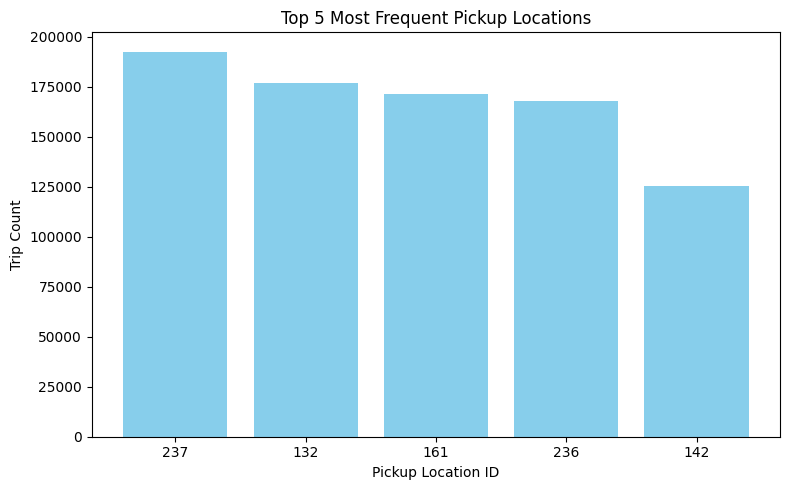

In [0]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.bar(pickup_top5_pd['PULocationID'].astype(str), pickup_top5_pd['count'], color='skyblue')
plt.xlabel('Pickup Location ID')
plt.ylabel('Trip Count')
plt.title('Top 5 Most Frequent Pickup Locations')
plt.tight_layout()
plt.show()


Top 5 dropoff locations

In [0]:
dropoff_top5 = df.groupBy("DOLocationID") \
                      .count() \
                      .orderBy(col("count").desc()) \
                      .limit(5)

dropoff_top5_pd=dropoff_top5.toPandas()

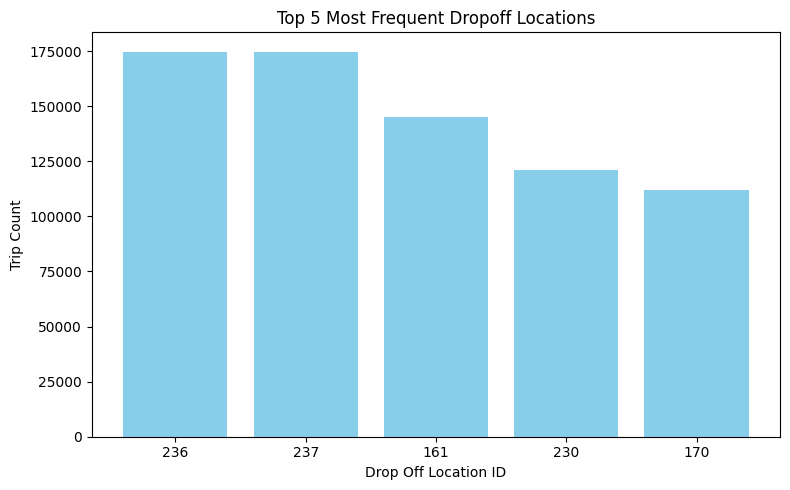

In [0]:
plt.figure(figsize=(8, 5))
plt.bar(dropoff_top5_pd['DOLocationID'].astype(str), dropoff_top5_pd['count'], color='skyblue')
plt.xlabel('Drop Off Location ID')
plt.ylabel('Trip Count')
plt.title('Top 5 Most Frequent Dropoff Locations')
plt.tight_layout()
plt.show()

Tip and fare correlation

In [0]:
correlation = df.stat.corr("fare_amount", "tip_amount")
print(f"Correlation between fare and tip: {correlation}")

Correlation between fare and tip: 0.5442627372170219


In [0]:

corr_pd = df.select("fare_amount", "tip_amount").sample(False, 0.01).toPandas()


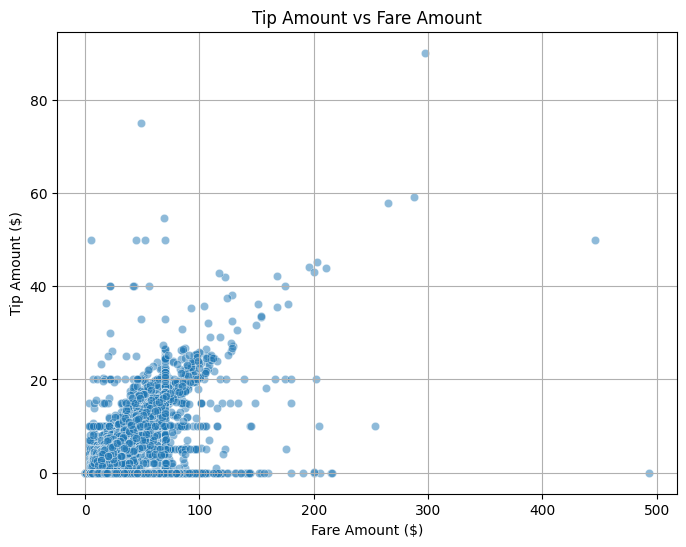

In [0]:
import seaborn as sns


plt.figure(figsize=(8, 6))
sns.scatterplot(data=corr_pd, x="fare_amount", y="tip_amount", alpha=0.5)
plt.title("Tip Amount vs Fare Amount")
plt.xlabel("Fare Amount ($)")
plt.ylabel("Tip Amount ($)")
plt.grid(True)
plt.show()


